In [4]:
!uv pip install numpy tensorflow pandas opencv-python Pillow keras matplotlib kaggle kagglehub

Resolved 66 packages in 826ms                                        
⠙ Preparing packages... (0/48)                                                  
⠙ Preparing packages... (0/48)---     0 B/8.31 MiB                      
⠙ Preparing packages... (0/48)--- 16.00 KiB/8.31 MiB                    
⠙ Preparing packages... (0/48)--- 32.00 KiB/8.31 MiB                    
⠙ Preparing packages... (0/48)--- 48.00 KiB/8.31 MiB                    
⠙ Preparing packages... (0/48)--- 64.00 KiB/8.31 MiB                    
⠙ Preparing packages... (0/48)--- 80.00 KiB/8.31 MiB                    
⠙ Preparing packages... (0/48)--- 96.00 KiB/8.31 MiB                    
⠙ Preparing packages... (0/48)--- 112.00 KiB/8.31 MiB                   
⠙ Preparing packages... (0/48)--- 128.00 KiB/8.31 MiB                   
⠙ Preparing packages... (0/48)--- 144.00 KiB/8.31 MiB                   
⠙ Preparing packages... (0/48)--- 160.00 KiB/8.31 MiB                   
⠙ Preparing packages... (0/48)--- 176.00 KiB/8

In [5]:
import numpy as np
import tensorflow as tf
import pandas as pd
import cv2
import pathlib
import os
import string
from PIL import Image
from keras import backend as K
import matplotlib.pyplot as plt

2026-01-23 17:20:00.277118: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-23 17:20:00.303925: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-23 17:20:02.437175: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


# Introduction

- What does the convolutional neural network depend on in making its decision? The next project shows the way in which areas can be identified from the medical images through which a decision can be made whether there is a cancerous tumor in the medical images or not and generate a heat map that helps determine the places of most interest for the convolutional neural network. Which helped her make her decision.
- Two methodologies were used to track the location of the cancer tumor based on a convolutional neural network whose task is to classify the presence of a cancerous disease, and thus the study explains and interprets what the convolutional neural network sees and what it relies on in making the final classification decision.
- GradCAM / GradCAM++ is used to interpret what a convolutional neural network sees.

# Preparation and processing of dataset

### 1. Install the Kaggle API Client

In [6]:
import kagglehub
import os

# Download latest version of the dataset
path = kagglehub.dataset_download("preetviradiya/brian-tumor-dataset")

print(f"Path to downloaded dataset root: {path}")


/home/vrathik/grad cam/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Path to downloaded dataset root: /home/vrathik/.cache/kagglehub/datasets/preetviradiya/brian-tumor-dataset/versions/1


### 5. Unzip the Dataset

Most Kaggle datasets are downloaded as `.zip` files. You'll need to unzip them to access the contents. You can also specify the target directory for unzipping.

In [7]:
# List the contents of the downloaded directory to inspect its structure
print(f"Contents of {path}:")
!ls -R "{path}"

# The actual data is usually nested within 'Brain Tumor Data Set/Brain Tumor Data Set'
# We will set the final datasetfolder in the next cell.

Contents of /home/vrathik/.cache/kagglehub/datasets/preetviradiya/brian-tumor-dataset/versions/1:
/home/vrathik/.cache/kagglehub/datasets/preetviradiya/brian-tumor-dataset/versions/1:
'Brain Tumor Data Set'	 metadata.csv   metadata_rgb_only.csv

'/home/vrathik/.cache/kagglehub/datasets/preetviradiya/brian-tumor-dataset/versions/1/Brain Tumor Data Set':
'Brain Tumor Data Set'

'/home/vrathik/.cache/kagglehub/datasets/preetviradiya/brian-tumor-dataset/versions/1/Brain Tumor Data Set/Brain Tumor Data Set':
'Brain Tumor'   Healthy

'/home/vrathik/.cache/kagglehub/datasets/preetviradiya/brian-tumor-dataset/versions/1/Brain Tumor Data Set/Brain Tumor Data Set/Brain Tumor':
'Cancer (1000).jpg'  'Cancer (174).jpg'   'Cancer (304).jpg'
'Cancer (1001).jpg'  'Cancer (1750).jpg'  'Cancer (305).jpg'
'Cancer (1002).JPG'  'Cancer (1751).jpg'  'Cancer (306).jpg'
'Cancer (1003).jpg'  'Cancer (1752).jpg'  'Cancer (307).jpg'
'Cancer (1004).jpg'  'Cancer (1753).jpg'  'Cancer (308).jpg'
'Cancer (1005).jpg'

### 6. Update the `datasetfolder` variable

Now that the dataset is downloaded and unzipped, you can update the `datasetfolder` variable in your notebook to point to the correct path within Colab.

In [8]:
# Update the datasetfolder variable to the correct path within the unzipped data
# Based on typical Kaggle dataset structures and kagglehub download location
datasetfolder = os.path.join(path, "Brain Tumor Data Set", "Brain Tumor Data Set")
print(f"Updated dataset folder path: {datasetfolder}")

Updated dataset folder path: /home/vrathik/.cache/kagglehub/datasets/preetviradiya/brian-tumor-dataset/versions/1/Brain Tumor Data Set/Brain Tumor Data Set


In [11]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
ge = ImageDataGenerator(rescale = 1/255,
                        rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        fill_mode = 'constant',
                        validation_split = 0.2,
                        horizontal_flip = True,
                        vertical_flip = True,
                        zoom_range = 0.2
                        )

In [12]:
datasetfolder = os.path.join(path, "Brain Tumor Data Set", "Brain Tumor Data Set")
dataflowtraining = ge.flow_from_directory(directory = datasetfolder,
                                 target_size = (224, 224),
                                 color_mode = 'rgb',
                                 batch_size = 32,
                                 shuffle = True,
                                 subset = 'training')
dataflowvalidation = ge.flow_from_directory(directory = datasetfolder,
                                           target_size = (224, 224),
                                           color_mode = 'rgb',
                                           batch_size = 32,
                                           shuffle = True,
                                           subset = 'validation')

Found 3681 images belonging to 2 classes.
Found 919 images belonging to 2 classes.


In [14]:
!uv add scipy

Resolved 13 packages in 381ms                                        
⠙ Preparing packages... (0/1)                                                   
⠙ Preparing packages... (0/1)----     0 B/33.39 MiB                     
⠙ Preparing packages... (0/1)---- 16.00 KiB/33.39 MiB                   
⠙ Preparing packages... (0/1)---- 32.00 KiB/33.39 MiB                   
⠙ Preparing packages... (0/1)---- 48.00 KiB/33.39 MiB                   
⠙ Preparing packages... (0/1)---- 64.00 KiB/33.39 MiB                   
⠹ Preparing packages... (0/1)---- 80.00 KiB/33.39 MiB                   
⠹ Preparing packages... (0/1)---- 80.00 KiB/33.39 MiB                   
⠹ Preparing packages... (0/1)---- 96.00 KiB/33.39 MiB                   
⠹ Preparing packages... (0/1)---- 112.00 KiB/33.39 MiB                  
⠹ Preparing packages... (0/1)---- 128.00 KiB/33.39 MiB                  
⠹ Preparing packages... (0/1)---- 144.00 KiB/33.39 MiB                  
⠹ Preparing packages... (0/1)---- 160.00 KiB/3

In [15]:
images, labels = next(dataflowvalidation)
np.min(images), np.max(images)

(np.float32(0.0), np.float32(1.0))

/tmp/ipykernel_45847/1928996446.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


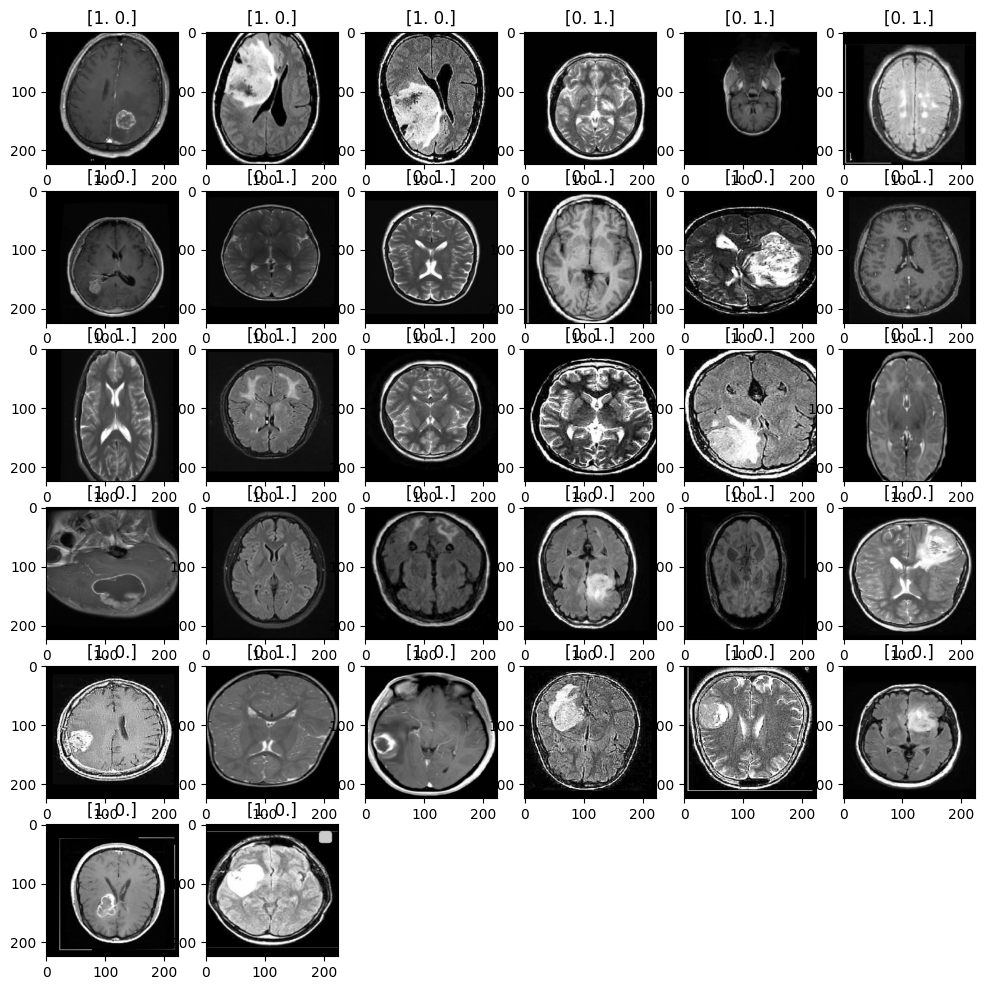

In [16]:
import matplotlib.pyplot as plt
images, labels = next(dataflowvalidation)
plt.figure(figsize = (12, 12))
for i in range(32):
    plt.subplot(6, 6, (i + 1))
    plt.imshow(images[i])
    plt.title(labels[i])
plt.legend()

# Convolutional neural network architecture proposal

We note here, that I did not freeze the first layers of the pre-trained neural network, but rather used weights to give a good or acceptable range and initialization to the weights included in the neural network, instead of starting from a random initialization of the values of the weights.

In [17]:
from keras.applications import DenseNet121
basemodel = DenseNet121(weights = 'imagenet', include_top = False,
                        input_shape = (224, 224, 3), pooling = None)
x = tf.keras.layers.Flatten()(basemodel.output)
x = tf.keras.layers.Dropout(0.7)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(16, activation = 'relu',)(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(2, activation = 'softmax')(x)
m = tf.keras.models.Model(inputs = basemodel.input, outputs = x)
m.compile(loss = 'binary_crossentropy',
          optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
         metrics = ['accuracy', tf.keras.metrics.Precision(name = 'precision'),
                   tf.keras.metrics.Recall(name = 'recall')])

I0000 00:00:1769169125.916224   45847 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 8832 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 SUPER, pci bus id: 0000:01:00.0, compute capability: 8.9


In [18]:
hist = m.fit(dataflowtraining, epochs = 10, batch_size = 32, #og epoch: 60
             validation_data = dataflowvalidation,
             callbacks = [
                tf.keras.callbacks.EarlyStopping(patience = 8, monitor = 'val_loss', mode = 'min',
                                                restore_best_weights = True),
                tf.keras.callbacks.ReduceLROnPlateau(patience = 6, monitor = 'val_loss',
                                                          mode = 'min', factor = 0.1)
            ])

Epoch 1/10


2026-01-23 17:22:35.371657: I external/local_xla/xla/service/service.cc:163] XLA service 0x78c864004a90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2026-01-23 17:22:35.371669: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 SUPER, Compute Capability 8.9
2026-01-23 17:22:36.032486: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2026-01-23 17:22:39.421025: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90501
2026-01-23 17:22:41.098870: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_31636', 4 bytes spill stores, 4 bytes spill loads

2026-01-23 17:22:41.129760: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] p

  1/116 ━━━━━━━━━━━━━━━━━━━━ 2:09:31 68s/step - accuracy: 0.6875 - loss: 0.7499 - precision: 0.6875 - recall: 0.6875

I0000 00:00:1769169204.409254   46651 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


116/116 ━━━━━━━━━━━━━━━━━━━━ 132s 559ms/step - accuracy: 0.7365 - loss: 0.6210 - precision: 0.7365 - recall: 0.7365 - val_accuracy: 0.8313 - val_loss: 0.3791 - val_precision: 0.8313 - val_recall: 0.8313 - learning_rate: 1.0000e-04
Epoch 2/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - accuracy: 0.9049 - loss: 0.3812 - precision: 0.9049 - recall: 0.9049 - val_accuracy: 0.9064 - val_loss: 0.2112 - val_precision: 0.9064 - val_recall: 0.9064 - learning_rate: 1.0000e-04
Epoch 3/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 17s 147ms/step - accuracy: 0.9378 - loss: 0.3104 - precision: 0.9378 - recall: 0.9378 - val_accuracy: 0.9608 - val_loss: 0.1490 - val_precision: 0.9608 - val_recall: 0.9608 - learning_rate: 1.0000e-04
Epoch 4/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - accuracy: 0.9620 - loss: 0.2667 - precision: 0.9620 - recall: 0.9620 - val_accuracy: 0.9717 - val_loss: 0.1480 - val_precision: 0.9717 - val_recall: 0.9717 - learning_rate: 1.0000e-04
Epoch 5/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 17s 14

# Results

In [19]:
m.evaluate(dataflowtraining)

116/116 ━━━━━━━━━━━━━━━━━━━━ 16s 140ms/step - accuracy: 0.9957 - loss: 0.0736 - precision: 0.9957 - recall: 0.9957


[0.07361350208520889,
 0.9956533312797546,
 0.9956533312797546,
 0.9956533312797546]

In [20]:
m.evaluate(dataflowvalidation)

29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - accuracy: 0.9967 - loss: 0.0719 - precision: 0.9967 - recall: 0.9967


[0.07189220190048218,
 0.9967355728149414,
 0.9967355728149414,
 0.9967355728149414]

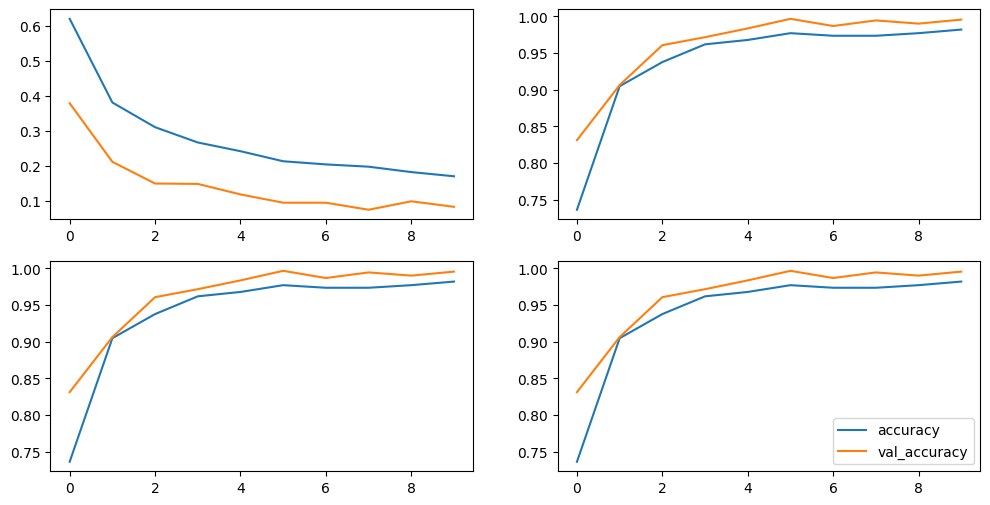

In [21]:
import matplotlib.pyplot as plt
plt.figure(figsize = (12, 6))
metrics = ['loss', 'precision', 'recall', 'accuracy']
for i in range(4):
    plt.subplot(2, 2, (i + 1))
    plt.plot(hist.history[metrics[i]], label = metrics[i])
    plt.plot(hist.history['val_{}'.format(metrics[i])], label = 'val_{}'.format(metrics[i]))
plt.legend()

In [22]:
m.save('./models/final_tumor_model.h5')

# Heat Map:
In this section, the focus was on the medical images in which there was a cancerous tumor, and the neural network was asked to predict that it contained a cancerous tumor or not, and at the same time to identify the areas that were relied upon in making a decision that the cancerous tumor was present within it.

In [23]:
def readtumorImages(imagespathes):
    images = []
    for img in imagespathes:
        img = cv2.imread(str(img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img/255
        img = cv2.resize(img, (224, 224))
        images.append(img)
    return np.array(images)

In [24]:
images = readtumorImages(list(pathlib.Path('/kaggle/input/brian-tumor-dataset/Brain Tumor Data Set/Brain Tumor Data Set/Brain Tumor').glob('*.*'))[:1000])
labels = tf.keras.utils.to_categorical(tf.zeros(shape = (images.shape[0])), num_classes = 2)
images.shape, labels.shape

((0,), TensorShape([0, 2]))

In [31]:
indexs = np.random.choice(images.shape[0], size=images.shape[0], replace=False)
images = tf.gather(images, indexs)
labels = tf.gather(labels, indexs)
images.shape, labels.shape

(TensorShape([0]), TensorShape([0, 2]))

In [32]:
m = tf.keras.models.load_model('./models/final_tumor_model.h5')

# Grad-Cam

In [40]:
def gradCam(image, true_label, layer_conv_name):
    model_grad = tf.keras.models.Model(inputs = m.input,
                              outputs = [m.get_layer(layer_conv_name).output,
                                         m.output])
    with tf.GradientTape() as tape:
        conv_output, predictions = model_grad(image)
        tape.watch(conv_output)
        loss = tf.losses.binary_crossentropy(true_label, predictions)
    grad = tape.gradient(loss, conv_output)
    # Changed K.mean to tf.reduce_mean
    grad = tf.reduce_mean(tf.abs(grad), axis = (0, 1, 2))
    conv_output = np.squeeze(conv_output.numpy())
    for i in range(conv_output.shape[-1]):
        conv_output[:, :, i] *= grad[i]
    heatmap = np.mean(conv_output, axis = -1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(heatmap * 255)
    return heatmap, np.squeeze(image)

In [41]:
def getHeatMap(images, labels):
    heatmaps = []
    for index in range(128):
        heatmap, image = gradCam(images[index: index + 1],
                                               labels[index: index + 1],
                                           'relu')
        heatmaps.append(heatmap)
    return np.array(heatmaps)

In [42]:
# Collect 128 images (4 batches of 32)
all_images = []
all_labels = []

for _ in range(4):
    imgs, lbls = next(dataflowvalidation)
    all_images.append(imgs)
    all_labels.append(lbls)

images = np.concatenate(all_images, axis=0)
labels = np.concatenate(all_labels, axis=0)

print(f"Images shape: {images.shape}")
print(f"Labels shape: {labels.shape}")

Images shape: (128, 224, 224, 3)
Labels shape: (128, 2)


In [43]:
heatmaps = getHeatMap(images, labels)
heatmaps.shape

(128, 224, 224)

# Grad-Cam++

In [47]:
def grad_cam_plus_plus(image, true_label, conv_layer):
    gradModel = tf.keras.models.Model(inputs = m.input, outputs = [
        m.get_layer(conv_layer).output,
        m.output
    ])
    with tf.GradientTape() as tape:
        conv_output, predict = gradModel(image)
        tape.watch(conv_output)
        score = predict[:, np.argmax(predict,)]
    grads = tape.gradient(score, conv_output)
    # Changed K.mean to tf.reduce_mean
    grads = tf.reduce_mean(tf.abs(grads), axis = [0, 1, 2])
    # Changed K.exp to tf.exp
    first = tf.exp(score)*grads
    second = tf.exp(score)*grads*grads
    third = tf.exp(score)*grads*grads*grads
    conv_output = np.squeeze(conv_output)
    x = conv_output
    x = np.sum(np.sum(x, axis = 0), axis = 0)
    grads = (second)/(2*second + third*x)
    conv_output = np.array(conv_output)
    for i in range(conv_output.shape[-1]):
        conv_output[:,:,i] = conv_output[:,:,i]*grads[i]
    conv_output = tf.reduce_mean(conv_output, axis = -1)
    heatmap = np.maximum(conv_output, 0)
    heatmap = heatmap/np.max(heatmap)
    heatmap = cv2.resize(heatmap, (224, 224))
    return heatmap  

In [48]:
def getHeatMap_plus_plus(images, labels):
    heatmaps = []
    for index in range(128):
        heatmap = grad_cam_plus_plus(images[index: index + 1],
                                               labels[index: index + 1],
                                           'relu')
        heatmaps.append(heatmap)
    return np.array(heatmaps)

In [49]:
GradCamplusheatmaps = getHeatMap_plus_plus(images, labels)
GradCamplusheatmaps.shape

(128, 224, 224)

In [50]:
def draw_compare(images, gradcam_heatmaps,
                 gradcamplus_heatmaps, labels):
  plt.figure(figsize = (12, 50))
  index = 0
  n = 0
  for i in range(120):
    plt.subplot(20, 6, (i + 1))
    if index == 0:
      plt.imshow(images[n])
      plt.title('Image-class: {}'.format(labels[n]))
      index = 1
    elif index == 1:
      plt.imshow(images[n])
      plt.imshow(gradcam_heatmaps[n], alpha = 0.6, cmap = 'jet')
      plt.title('Grad-Cam')
      index = 2
    elif index == 2:
      plt.imshow(images[n])
      plt.imshow(gradcamplus_heatmaps[n], alpha = 0.6, cmap = 'jet')
      plt.title('Grad-Cam++')
      index = 0
      n = n + 1
  plt.legend()

In [51]:
l = np.argmax(labels, axis = 1)
l.shape

(128,)

/tmp/ipykernel_45847/912788596.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


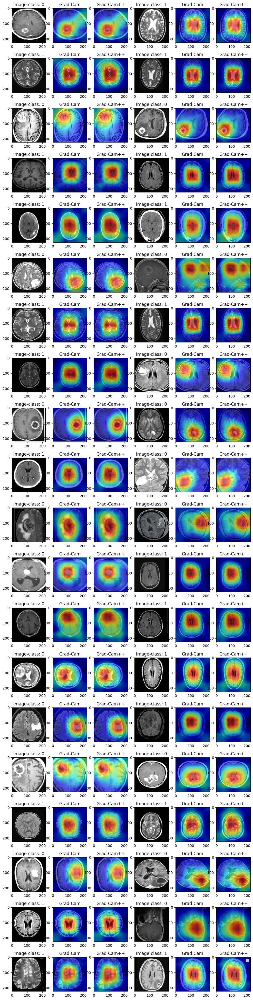

In [52]:
import matplotlib.pyplot as plt
draw_compare(images[:40], heatmaps[:40],
                 GradCamplusheatmaps[:40], l[:40])

/tmp/ipykernel_45847/912788596.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


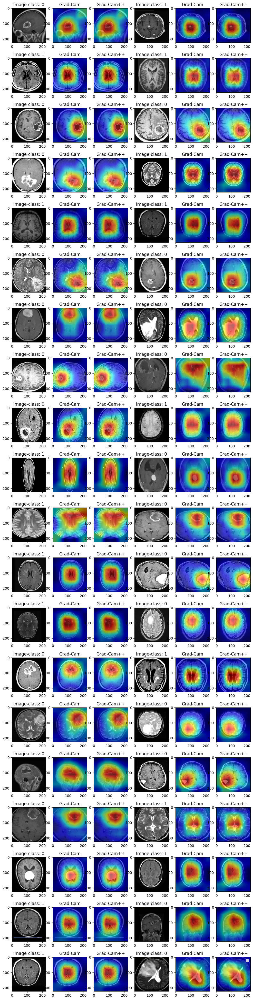

In [53]:
draw_compare(images[40:80], heatmaps[40:80],
                 GradCamplusheatmaps[40:80], l[40:80])

/tmp/ipykernel_45847/912788596.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


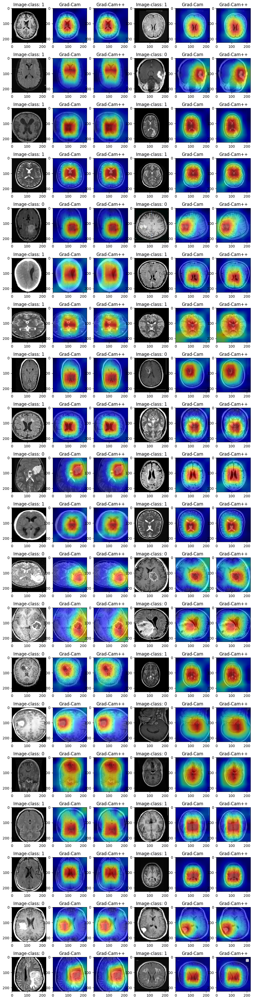

In [54]:
draw_compare(images[80:120], heatmaps[80:120],
                 GradCamplusheatmaps[80:120], l[80:120])